In [16]:
# %matplotlib notebook
import numpy as np
import scipy.linalg as la
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import os
import glob
from PIL import Image
from scipy.special import comb
from scipy.io import loadmat

%matplotlib inline

In [54]:
def homogenize(x):
    return np.append(x,1)

def decompose(P):
    '''
    Decomposes a camera projection matrix P into K, R, and t
    '''
    M = P[:3,:3]
    Minv = la.inv(M)
    C = -Minv @ P[:3,3]
    
    # R must be orthogonal
    # K must be upper triangular
    K,R = la.rq( M )
    
    # Enforce that K has positive diagonals
    T = np.diag( np.sign( np.diag(K) ) )
    K = K @ T
    K = K / K[2,2]
    R = T @ R
    
    t = -R @ C
    
    return K,R,t

def reconstruct(K,R,t):
    '''
    Reconstructs a camera matrix P from
    intrinsic matrix K
    rotation matrix R
    translation vector t
    used for debugging `decompose`
    '''
    Rt = np.vstack((R.T,t)).T
    P = K @ Rt
    return P

def triangulate_l2(u1,u2,P1,P2):
    K,R1,t1 = decompose(P1)
    _,R2,t2 = decompose(P2)

    # Relative rotation and translation that transform
    # a point from C1 to C2
    R = R2 @ R1.T
    t = -R2 @ R1.T @ t1 + t2
    
    # precompute for speedup
    Kinv = la.inv(K)
    
    m1 = R @ Kinv @ u1
    m2 = Kinv @ u2
    
    # unit vectors
    m1hat = m1 / la.norm(m1)
    m2hat = m2 / la.norm(m2)
    that = t / la.norm(t)
    
    # SVD matrix
    MT = np.vstack( (m1,m2) )
    P = np.eye(3) - np.outer(that,that)
    A = MT @ P
    _,_,Vh = la.svd(A)
    nhat = Vh[1]
    
    # corrections of m1 and m2
    m1p = m1 - np.dot(m1, nhat) * nhat
    m2p = m2 - np.dot(m2, nhat) * nhat
    
    Rf1p = m1p
    f2p = m2p
    z = np.cross(f2p, Rf1p)
    
    X1 = t + np.dot( z, np.cross(t, f2p) ) / la.norm(z)**2 * Rf1p
    X2 = np.dot( z, np.cross(t, Rf1p) ) / la.norm(z)**2 * f2p
    return R2.T @ (X2-t2)

def triangulate_linf(u1,u2,P1,P2):
    K,R1,t1 = decompose(P1)
    _,R2,t2 = decompose(P2)

    # Relative rotation and translation that transform
    # a point from C1 to C2
    R = R2 @ R1.T
    t = -R2 @ R1.T @ t1 + t2
    
    # precompute for speedup
    Kinv = la.inv(K)
    
    m1 = R @ Kinv @ u1
    m2 = Kinv @ u2
    
    # unit vectors
    m1hat = m1 / la.norm(m1)
    m2hat = m2 / la.norm(m2)
    
    # normals
    na = np.cross( ( m1hat + m2hat ), t )
    nb = np.cross( ( m1hat - m2hat ), t )
    n = na if la.norm(na) >= la.norm(nb) else nb
    nhat = n / la.norm(n)
    
    # corrections of m1 and m2
    m1p = m1 - np.dot(m1, nhat) * nhat
    m2p = m2 - np.dot(m2, nhat) * nhat
    
    Rf1p = m1p
    f2p = m2p
    z = np.cross(f2p, Rf1p)
    
    X1 = t + np.dot( z, np.cross(t, f2p) ) / la.norm(z)**2 * Rf1p
    X2 = np.dot( z, np.cross(t, Rf1p) ) / la.norm(z)**2 * f2p
    return R2.T @ (X2-t2)

def triangulate_l1(u1,u2,P1,P2):
    K,R1,t1 = decompose(P1)
    _,R2,t2 = decompose(P2)
    C1 = -R1.T @ t1
    C2 = -R2.T @ t2
#     print(C1)
    

    # Relative rotation and translation that transform
    # a point from C1 to C2
    R = R2 @ R1.T
    t = -R2 @ R1.T @ t1 + t2
    
    # precompute for speedup
    Kinv = la.inv(K)
    
    f1 = Kinv @ u1
    f2 = Kinv @ u2
    
    m1 = R @ f1
    m2 = f2
    
    # unit vectors
    m1hat = m1 / la.norm(m1)
    m2hat = m2 / la.norm(m2)
    
    # normals
    n1 = np.cross(m1, t)
    n2 = np.cross(m2, t)
    n1hat = n1 / la.norm(n1)
    n2hat = n2 / la.norm(n2)
    
    # corrections of m1 and m2
    if la.norm( np.cross(m1, t) ) <= la.norm( np.cross(m2, t) ):
        m1p = m1 - np.dot(m1, n2hat) * n2hat
        m2p = m2
    else:
        m1p = m1
        m2p = m2 - np.dot(m2, n1hat) * n1hat
    
    Rf1p = m1
    f2p = m2
    z = np.cross(f2p, Rf1p)
    
    X1 = t + np.dot( z, np.cross(t, f2p) ) / la.norm(z)**2 * Rf1p
    X2 = np.dot( z, np.cross(t, Rf1p) ) / la.norm(z)**2 * f2p
    return R2.T @ (X2-t2)

In [32]:
dataset = 'dinosaur'

data_dir = os.path.join(os.getcwd(),'data')
image_dir = os.path.join(data_dir, dataset, 'images')
image_paths = sorted(glob.glob(os.path.join(image_dir, '*.ppm'), recursive=True))
cam_mat_path = os.path.join(data_dir, dataset, 'dino_Ps.mat')
points_2d_path = os.path.join(data_dir, dataset, 'viff.xy')

In [59]:
# read in ppm file
imgs = []
for i in range(len(image_paths)):
    imgs.append(np.array(Image.open(image_paths[i])))
    
n_imgs = 36

# read in camera projection matrices
cam_mats = loadmat(cam_mat_path)
cam_mats = cam_mats['P'][0]

# read in 2D points
points = []
with open(points_2d_path) as file:
    for line in file:
        points_i = np.zeros(2*n_imgs)
        j = 0
        for fl in line.split():
            points_i[j] = float(fl)
            j += 1
        points.append(points_i)
        
n_points = len(points)

In [117]:
pt = points[500]
c1 = 0
c2 = 1
u1 = homogenize(pt[0:2])
u2 = homogenize(pt[2:4])
P1 = cam_mats[0]
P2 = cam_mats[1]
print(triangulate_linf(u1,u2,P1,P2))
print(triangulate_l2(u1,u2,P1,P2))

[-0.01921386 -0.10875789 -0.5163254 ]
[-0.01919843 -0.10875925 -0.51629543]


In [69]:
X_inf = np.zeros((n_points,3))
for i in range(n_points):
    pt_i = points[i]
    views = np.squeeze(np.argwhere(pt_i >= 0))
    n_views = len(views) // 2
    n_view_pairs = comb(n_views,2)
    for j in range(n_views - 1):
        for k in range(j+1,n_views):
            c1 = views[2*j] // 2
            c2 = views[2*k] // 2
            
            u1 = homogenize( pt_i[2*c1:2*c1+2] )
            u2 = homogenize( pt_i[2*c2:2*c2+2] )
            
            P1 = cam_mats[c1]
            P2 = cam_mats[c2]
            
            X_inf[i] += triangulate_linf(u1,u2,P1,P2)
            
    X_inf[i] /= n_view_pairs

In [116]:
def plot_view_from_cam(ax,cam_index):
    ax.scatter(X_inf[:,0],X_inf[:,1],X_inf[:,2],c='b',s=1)  
    mean = np.sum(X_inf,axis=0) / n_points
    
    K,R,t = decompose(cam_mats[cam_index])
    C = -R.T @ t
    
    x = C[0] - mean[0]
    y = C[1] - mean[1]
    z = C[2] - mean[2]
    az = np.arctan2(y,x) * 180 / np.pi
    el = np.arctan(z/la.norm([x,y])) * 180 / np.pi
    
    ax.set_xlabel('X')
    ax.set_zlabel('Z')
    ax.set_ylabel('Y')
    ax.axis('equal')
    ax.set_aspect('equal')
    ax.view_init(elev=el,azim=az)
    

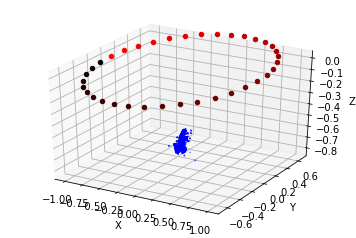

In [85]:
fig = plt.figure()
ax = fig.add_subplot(111,projection='3d')
ax.scatter(X_inf[:,0],X_inf[:,1],X_inf[:,2],c='b',s=1)   
ax.set_xlabel('X')
ax.set_zlabel('Z')
ax.set_ylabel('Y')
ax.axis('equal')
for i in range(n_imgs):
    K,R,t = decompose(cam_mats[i])
    C = -R.T @ t
#     ax.scatter(C[0],C[1],C[2],c='r',alpha=(1-i/100))
    color = np.array([1,0,0]) * (1 - i/n_imgs)
    ax.scatter(C[0],C[1],C[2],c=color)
    
plt.show()

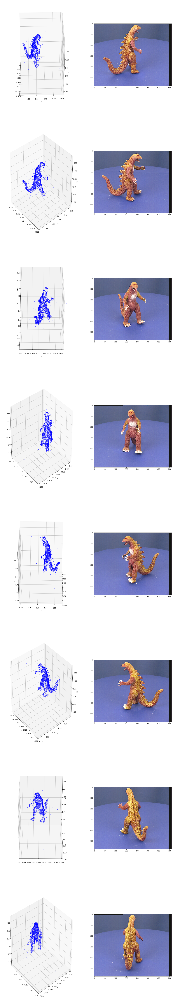

In [115]:
fig = plt.figure(figsize=(20,120))
for i in range(8):
    view_index = (i * 36) // 8
    ax = fig.add_subplot(8,2,2*i+1,projection='3d')
    plot_view_from_cam(ax,view_index)
    ax = fig.add_subplot(8,2,2*i+2)
    ax.imshow(imgs[view_index])
        
plt.show()

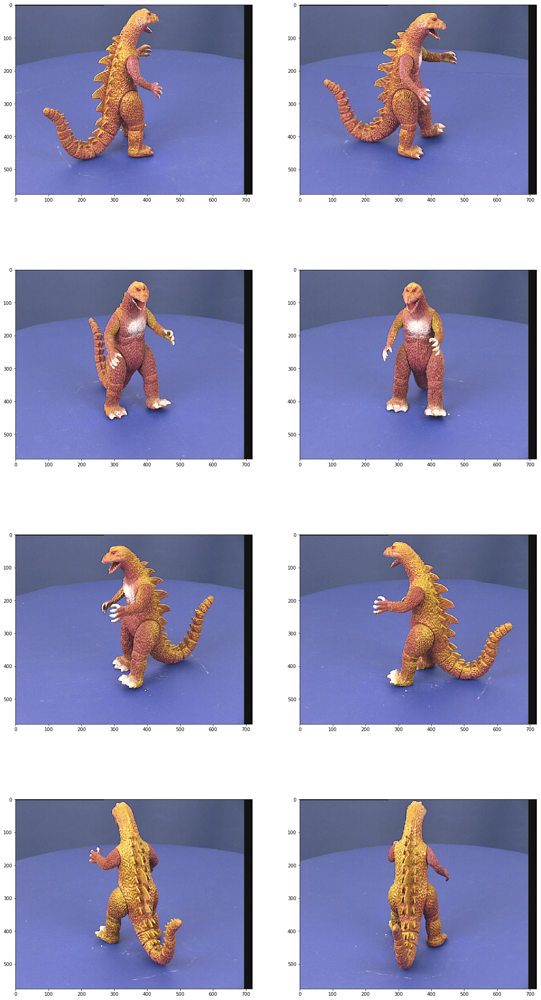

In [106]:
fig = plt.figure(figsize=(20,40))
for i in range(8):
    view_index = (i * 36) // 8
    ax = fig.add_subplot(4,2,i+1)
    ax.imshow(imgs[view_index])
        
plt.show()